In [25]:
pip install -U fortran-magic

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 19.4 MB/s eta 0:00:00


In [26]:
%matplotlib inline
%load_ext fortranmagic

import sys; sys.path.append('..')

import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

mpl.rc('figure', figsize=(12, 7))

ran_the_first_cell = True

jan2017 = pd.to_datetime(['2017-01-03 00:00:00+00:00',
 '2017-01-04 00:00:00+00:00',
 '2017-01-05 00:00:00+00:00',
 '2017-01-06 00:00:00+00:00',
 '2017-01-09 00:00:00+00:00',
 '2017-01-10 00:00:00+00:00',
 '2017-01-11 00:00:00+00:00',
 '2017-01-12 00:00:00+00:00',
 '2017-01-13 00:00:00+00:00',
 '2017-01-17 00:00:00+00:00',
 '2017-01-18 00:00:00+00:00',
 '2017-01-19 00:00:00+00:00',
 '2017-01-20 00:00:00+00:00',
 '2017-01-23 00:00:00+00:00',
 '2017-01-24 00:00:00+00:00',
 '2017-01-25 00:00:00+00:00',
 '2017-01-26 00:00:00+00:00',
 '2017-01-27 00:00:00+00:00',
 '2017-01-30 00:00:00+00:00',
 '2017-01-31 00:00:00+00:00',
 '2017-02-01 00:00:00+00:00'])
calendar = jan2017.values.astype('datetime64[D]')

event_dates = pd.to_datetime(['2017-01-06 00:00:00+00:00',
                             '2017-01-07 00:00:00+00:00',
                             '2017-01-08 00:00:00+00:00']).values.astype('datetime64[D]')
event_values = np.array([10, 15, 20])

<center>
  <h1>The PyData Toolbox</h1>
  <h3>Scott Sanderson (Twitter: @scottbsanderson, GitHub: ssanderson)</h3>
  <h3><a href="https://github.com/ssanderson/pydata-toolbox">https://github.com/ssanderson/pydata-toolbox</a></h3>
</center>

# About Me:

<img src="https://raw.githubusercontent.com/ssanderson/pydata-toolbox/master/notebooks/images/me.jpg" alt="Drawing" style="width: 300px;"/>

- Senior Engineer at [Quantopian](www.quantopian.com)
- Background in Mathematics and Philosophy
- **Twitter:** [@scottbsanderson](https://twitter.com/scottbsanderson)
- **GitHub:** [ssanderson](github.com/ssanderson)

## Outline

- Built-in Data Structures
- Numpy `array`
- Pandas `Series`/`DataFrame`
- Plotting and "Real-World" Analyses

# Data Structures

> Rule 5. Data dominates. If you've chosen the right data structures and organized things well, the algorithms
will almost always be self-evident. Data structures, not algorithms, are central to programming.

- *Notes on Programming in C*, by Rob Pike.

# Lists

In [ ]:
assert ran_the_first_cell, "Oh noes!"

NameError: ignored

In [ ]:
l = [1, 'two', 3.0, 4, 5.0, "six"]
l

[1, 'two', 3.0, 4, 5.0, 'six']

In [ ]:
# Lists can be indexed like C-style arrays.
first = l[0]
second = l[1]
print("first:", first)
print("second:", second)

first: 1
second: two


In [ ]:
# Negative indexing gives elements relative to the end of the list.
last = l[-1]
penultimate = l[-2]
print("last:", last)
print("second to last:", penultimate)

last: six
second to last: 5.0


In [ ]:
# Lists can also be sliced, which makes a copy of elements between
# start (inclusive) and stop (exclusive)
sublist = l[1:3]
sublist

['two', 3.0]

In [ ]:
# l[:N] is equivalent to l[0:N].
first_three = l[:3]
first_three

[1, 'two', 3.0]

In [ ]:
# l[3:] is equivalent to l[3:len(l)].
after_three = l[3:]
after_three

[4, 5.0, 'six']

In [ ]:
# There's also a third parameter, "step", which gets every Nth element.
l = ['a', 'b', 'c', 'd', 'e', 'f', 'g','h']
l[1:7:2]

['b', 'd', 'f']

In [ ]:
# This is a cute way to reverse a list.
l[::-1]

['h', 'g', 'f', 'e', 'd', 'c', 'b', 'a']

In [ ]:
# Lists can be grown efficiently (in O(1) amortized time).
l = [1, 2, 3, 4, 5]
print("Before:", l)
l.append('six')
print("After:", l)

Before: [1, 2, 3, 4, 5]
After: [1, 2, 3, 4, 5, 'six']


In [ ]:
# Comprehensions let us perform elementwise computations.
l = [1, 2, 3, 4, 5]
[x * 2 for x in l]

[2, 4, 6, 8, 10]

## Review: Python Lists

- Zero-indexed sequence of arbitrary Python values.
- Slicing syntax: `l[start:stop:step]` copies elements at regular intervals from `start` to `stop`.
- Efficient (`O(1)`) appends and removes from end.
- Comprehension syntax: `[f(x) for x in l if cond(x)]`.

# Dictionaries

In [ ]:
# Dictionaries are key-value mappings.
philosophers = {'David': 'Hume', 'Immanuel': 'Kant', 'Bertrand': 'Russell'}
philosophers

{'Bertrand': 'Russell', 'David': 'Hume', 'Immanuel': 'Kant'}

In [ ]:
# Like lists, dictionaries are size-mutable.
philosophers['Ludwig'] = 'Wittgenstein'
philosophers

{'Bertrand': 'Russell',
 'David': 'Hume',
 'Immanuel': 'Kant',
 'Ludwig': 'Wittgenstein'}

In [ ]:
del philosophers['David']
philosophers

{'Bertrand': 'Russell', 'Immanuel': 'Kant', 'Ludwig': 'Wittgenstein'}

In [ ]:
# No slicing.
philosophers['Bertrand':'Immanuel']

TypeError: unhashable type: 'slice'

## Review: Python Dictionaries

- Unordered key-value mapping from (almost) arbitrary keys to arbitrary values.
- Efficient (`O(1)`) lookup, insertion, and deletion.
- No slicing (would require a notion of order).

<center><img src="https://raw.githubusercontent.com/ssanderson/pydata-toolbox/master/notebooks/images/pacino.gif" alt="Drawing" style="width: 100%;"/></center>


In [11]:
# Suppose we have some matrices...
a = [[1, 2, 3],
     [2, 3, 4],
     [5, 6, 7],
     [1, 1, 1]]

b = [[1, 2, 3, 4],
     [2, 3, 4, 5]]

In [ ]:
def matmul(A, B):
    """Multiply matrix A by matrix B."""
    rows_out = len(A)
    cols_out = len(B[0])
    out = [[0 for col in range(cols_out)] for row in range(rows_out)]

    for i in range(rows_out):
        for j in range(cols_out):
            for k in range(len(B)):
                out[i][j] += A[i][k] * B[k][j]
    return out

<center><img src="https://raw.githubusercontent.com/ssanderson/pydata-toolbox/master/notebooks/images/gross.gif" alt="Drawing" style="width: 50%;"/></center>


In [ ]:
%%time

matmul(a, b)

CPU times: user 0 ns, sys: 0 ns, total: 0 ns
Wall time: 21 µs


[[5, 8, 11, 14], [8, 13, 18, 23], [17, 28, 39, 50], [3, 5, 7, 9]]

**My own example 0 - cpu info**

In [6]:
!cat /proc/cpuinfo

processor	: 0
vendor_id	: GenuineIntel
cpu family	: 6
model		: 79
model name	: Intel(R) Xeon(R) CPU @ 2.20GHz
stepping	: 0
microcode	: 0xffffffff
cpu MHz		: 2199.998
cache size	: 56320 KB
physical id	: 0
siblings	: 2
core id		: 0
cpu cores	: 1
apicid		: 0
initial apicid	: 0
fpu		: yes
fpu_exception	: yes
cpuid level	: 13
wp		: yes
flags		: fpu vme de pse tsc msr pae mce cx8 apic sep mtrr pge mca cmov pat pse36 clflush mmx fxsr sse sse2 ss ht syscall nx pdpe1gb rdtscp lm constant_tsc rep_good nopl xtopology nonstop_tsc cpuid tsc_known_freq pni pclmulqdq ssse3 fma cx16 pcid sse4_1 sse4_2 x2apic movbe popcnt aes xsave avx f16c rdrand hypervisor lahf_lm abm 3dnowprefetch invpcid_single ssbd ibrs ibpb stibp fsgsbase tsc_adjust bmi1 hle avx2 smep bmi2 erms invpcid rtm rdseed adx smap xsaveopt arat md_clear arch_capabilities
bugs		: cpu_meltdown spectre_v1 spectre_v2 spec_store_bypass l1tf mds swapgs taa mmio_stale_data retbleed
bogomips	: 4399.99
clflush size	: 64
cache_alignment	: 64
addres

**My own example 1 - Changing in matmul(A, B) Python len(B) (# of rows of B) for len(A[0]) (# of columns of A)**

In [7]:
def matmul(A, B):
    """Multiply matrix A by matrix B."""
    rows_out = len(A)
    cols_out = len(B[0])
    out = [[0 for col in range(cols_out)] for row in range(rows_out)]

    for i in range(rows_out):
        for j in range(cols_out):
            for k in range(len(A[0])):
                out[i][j] += A[i][k] * B[k][j]
    return out

**My own example 2 - Verifiying error with in matmul(A, B) Python with the original matrices when changing len(B) (# of rows of B) for len(A[0]) (# of colums of A)**

In [12]:
#example matrices
a = [[1, 2, 3],
     [2, 3, 4],
     [5, 6, 7],
     [1, 1, 1]]

b = [[1, 2, 3, 4],
     [2, 3, 4, 5]]

In [13]:
%%time
matmul(a, b)

This pair of matrix are not multipliable
CPU times: user 793 µs, sys: 0 ns, total: 793 µs
Wall time: 820 µs


**My own example 3 - Chekcing the matrix multiplication compatibility condition  len(A[0]) == len(B)**

In [9]:
def matmul(A, B):
    if len(A[0]) != len(B):
      print("This pair of matrix are not multipliable")
      return


    """Multiply matrix A by matrix B."""
    rows_out = len(A)
    cols_out = len(B[0])

    out = [[0 for col in range(cols_out)] for row in range(rows_out)]

    for i in range(rows_out):
        for j in range(cols_out):
            for k in range(len(A[0])):
                out[i][j] += A[i][k] * B[k][j]
    return out

**My own example 4 -  Verifiying error with in matmul(A, B) Python when checking the mtarix multiplication compatibility condition  len(A[0]) == len(B)**

In [14]:
matmul(a,b)

This pair of matrix are not multipliable


**My own example 5 - Deifining A and B that are compatible for multiplcation**

In [15]:
A = [[1,2,3],
     [4,5,6],
     [7,8,9],
     [10,11,12]]

B=[[12,11,10,9],
   [8,7,6,5],
   [4,3,2,1]]

**My own example 6 - Runinng the correct Python matrix multiplication code with the matrices with dimensions compatible for multiplication.**

In [16]:
import random
def random_matrix(m, n):
    out = []
    for row in range(m):
        out.append([random.random() for _ in range(n)])
    return out

randa = random_matrix(600,100)
randb = random_matrix(100,600)

matmul(randa,randb)

[[26.430563768894505,
  24.19282684028019,
  24.75234096174788,
  26.076582528181294,
  24.04816914495362,
  26.26521003203864,
  22.094285484542105,
  29.220217909180857,
  24.172812441825148,
  25.079415750768742,
  23.53663228880698,
  25.779498455605204,
  26.208800736794696,
  27.9793836935666,
  28.890876664146855,
  24.400302020425766,
  23.281518974361852,
  26.116289789734367,
  22.68920463968602,
  23.83717365117027,
  23.926155451836838,
  25.78440015149025,
  27.58677550937026,
  24.316015406792967,
  25.177481601211273,
  24.067431447676327,
  25.607484146333352,
  26.334256250094473,
  24.257448964005263,
  27.132874325109253,
  25.69386350039844,
  25.04692611699893,
  23.422638115309418,
  25.286669787783612,
  25.95316526093783,
  22.626934708151804,
  24.75331464898301,
  24.600964191366582,
  27.815087092752314,
  27.508074500544975,
  24.6183907004715,
  23.97153256559511,
  26.472519625289106,
  23.88816208270227,
  26.40516057087011,
  27.205590575145585,
  25.936

**My own example 7 - Running 10 times matmul(randa, randb) with randa and randb a randon matrices of 600 x 100 and 100 x 600 and calulating the average execution time**

In [17]:
%%time

import time

mean = 0
for i in range(10):
  start_time = time.time()
  randa = random_matrix(600,100)
  randb = random_matrix(100,600)
  matmul(randa,randb)
  t = time.time() - start_time
  mean = mean + t

mean = mean/10
print(mean)

10.169024634361268
CPU times: user 1min 39s, sys: 190 ms, total: 1min 39s
Wall time: 1min 41s


**My own example 8 - Creating the average execution time data frame and adding Python's average execution time**

In [18]:
import pandas as pd

df = pd.DataFrame()
df['Language'] = None
df['Average secs'] = None
df['Speed factor'] = None


new_row = pd.Series(['Python', mean, 0], index=df.columns)
df = df.append(new_row, ignore_index=True)

print(df)

  Language  Average secs Speed factor
0   Python     10.169025            0


<ipython-input-18-4b4d23d934ef>:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)


**My own example 9 - Running 10 times randa and randb mutiplicaction as NumPy arrays  adding NumPy's average execution time**

In [19]:
%%time
import numpy as np

for i in range(10):
  M1 = np.array([randa])
  M2 = np.array([randb])
  print(np.dot(M1, M2))

  mean = 0

for i in range(10):
  start_time = time.time()
  np.dot(randa,randb)
  d = time.time() - start_time
  mean= mean + d

mean=mean/10

[[[[25.88495366 30.12100178 27.33120418 ... 27.11874927 27.56507101
    28.10503269]]

  [[25.97275776 26.96196162 26.20160237 ... 29.32761985 26.82047749
    26.44730449]]

  [[21.18828181 25.92370762 23.34732412 ... 24.56224093 24.01888605
    25.17920207]]

  ...

  [[21.54848183 23.60248769 22.37175999 ... 21.72029589 22.54525302
    23.15788051]]

  [[23.6942925  27.37935266 24.91162227 ... 27.13500702 24.10738746
    26.27957935]]

  [[21.75962591 25.02384521 23.01542661 ... 23.66322463 22.59569011
    24.21149901]]]]
[[[[25.88495366 30.12100178 27.33120418 ... 27.11874927 27.56507101
    28.10503269]]

  [[25.97275776 26.96196162 26.20160237 ... 29.32761985 26.82047749
    26.44730449]]

  [[21.18828181 25.92370762 23.34732412 ... 24.56224093 24.01888605
    25.17920207]]

  ...

  [[21.54848183 23.60248769 22.37175999 ... 21.72029589 22.54525302
    23.15788051]]

  [[23.6942925  27.37935266 24.91162227 ... 27.13500702 24.10738746
    26.27957935]]

  [[21.75962591 25.02384521 

In [20]:
new_row = pd.Series(['Numpy', mean, 0], index=df.columns)
df = df.append(new_row, ignore_index=True)

print(df)

  Language  Average secs Speed factor
0   Python     10.169025            0
1    Numpy      0.024777            0


<ipython-input-20-414499e39cab>:2: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)


In [21]:
%%time
randa = random_matrix(600, 100)
randb = random_matrix(100, 600)
x = matmul(randa, randb)

CPU times: user 10.2 s, sys: 29.7 ms, total: 10.2 s
Wall time: 10.3 s


In [22]:
# Maybe that's not that bad?  Let's try a simpler case.
def python_dot_product(xs, ys):
    return sum(x * y for x, y in zip(xs, ys))

In [20]:
%%fortran
subroutine fortran_dot_product(xs, ys, result)
    double precision, intent(in) :: xs(:)
    double precision, intent(in) :: ys(:)
    double precision, intent(out) :: result

    result = sum(xs * ys)
end

UsageError: Cell magic `%%fortran` not found.


In [ ]:
list_data = [float(i) for i in range(100000)]
array_data = np.array(list_data)

In [ ]:
%%time
python_dot_product(list_data, list_data)

CPU times: user 4 ms, sys: 0 ns, total: 4 ms
Wall time: 6.95 ms


333328333350000.0

In [ ]:
%%time
fortran_dot_product(array_data, array_data)

CPU times: user 0 ns, sys: 0 ns, total: 0 ns
Wall time: 181 µs


333328333350000.0

<center><img src="https://raw.githubusercontent.com/ssanderson/pydata-toolbox/master/notebooks/images/sloth.gif" alt="Drawing" style="width: 1080px;"/></center>


**My own example 10 - Deifining A (2x2)  and B (2x2)**

In [23]:
A_1 = [[1, 2],
     [3, 4]]

B_1 = [[4, 3],
     [2, 1]]

**My own example 11 - Defining Fortran subroutine matmul(A,B) for 2x2 matrices**

In [27]:
%%fortran
subroutine matmul(A,B,R)
    implicit none
    double precision, intent(in) :: A(2,*)
    double precision, intent(in) :: B(2,*)
    double precision, intent(out) :: R(2,2)
    integer I,J,K,aux
    do I=1,2
      do J=1,2
        R(I,J)=0
        do K=1,2
          R(I,J) = R(I,J) + A(I,K) * B(K,J)
        end do
      end do
    end do
end

**My own example 12 -Run Fortran subroutine matmul(A,B) with a and b 2x2 matrices**

In [28]:
matmul (A_1,B_1)

array([[ 8.,  5.],
       [20., 13.]])

**My own example 13 - Defining Fortran subroutine matmul(A,B) for 600x100 and 100x600 matrices**

In [29]:
%%fortran
subroutine matmulti(A,B,N,L,M,R)
    implicit none
    integer, intent(in) :: N,L,M
    double precision, intent(in) :: A(600,*)
    double precision, intent(in) :: B(100,*)
    double precision, intent(out) :: R(N,M)
    integer I,J,K,aux
    do I=1,N
      do J=1,M
        R(I,J)=0
        do K=1,L
          R(I,J) = R(I,J) + A(I,K) * B(K,J)
        end do
      end do
    end do
end

**My own example 14 -Run Fortran subroutine matmul(A,B) with 600x100 and 100x600 matrices**

In [30]:
A = np.array(random_matrix(600,100))
B = np.array(random_matrix(100,600))

N=len(A)
L=len(A[0])
M=len(B[0])

matmulti(A,B,N,L,M)

array([[23.60352405, 24.12947533, 24.38580318, ..., 24.41432499,
        23.67544079, 21.63986352],
       [27.00605474, 26.24337787, 25.70791468, ..., 24.48917637,
        25.40055931, 23.71885349],
       [24.3261084 , 22.88012682, 24.51288561, ..., 22.0606779 ,
        23.19598447, 22.45320486],
       ...,
       [26.35970154, 26.86951724, 24.38283722, ..., 24.28975408,
        26.08405735, 23.99447655],
       [24.57011201, 22.9199589 , 22.26867067, ..., 23.56992516,
        24.48615705, 23.04565191],
       [24.52013109, 25.73228844, 25.99490001, ..., 22.90776289,
        25.74322409, 22.74023887]])

**My own example 15 - Running 10 times the  Fortran subroutine matmul(A,B) with 600x100 and 100x600 matrices and adding Fortran magic average execution time to the data frame**

In [31]:
%%time
for i in range(0,10):
  matmulti(A,B,N,L,M)

CPU times: user 437 ms, sys: 5.95 ms, total: 443 ms
Wall time: 450 ms


In [32]:
for i in range(10):
  start_time = time.time()
  matmulti(A,B,N,L,M)
  d = time.time() - start_time
  mean = mean + d

mean = mean/10

In [33]:
new_row = pd.Series(['Fortran magic', mean, 0], index=df.columns)
df = df.append(new_row, ignore_index=True)

print(df)

        Language  Average secs Speed factor
0         Python     10.169025            0
1          Numpy      0.024777            0
2  Fortran magic      0.045516            0


<ipython-input-33-580c2a8aa13d>:2: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)


**My own example 16 - Creating a  Fortran program that mutiplies 10 times A(600x100) and  B (100x600) matrices**

In [34]:
%%fortran
subroutine matmul22(A,B,N,L,M,R)
  implicit none
  integer,intent(in) :: N,L,M
  double precision, intent(in) :: A(600,*)
  double precision, intent(in) :: B(100,*)
  double precision, intent(out) :: R(N,M)
  integer I,X,J,K,aux
  do X=0, 10
    do I=1,N
      do J=1,M
        R(I,J)=0
        do K=1,L
          R(I,J) = R(I,J) + A(I,K)*B(K,J)
        end do
      end do
    end do
  end do
end

**My own example 17 - Running the Fortran program that mutiplies 10 times A(600x100) and  B (100x600) matrices**

In [35]:
A = np.array(random_matrix(600,100))
B = np.array(random_matrix(100,600))

N=len(A)
L=len(A[0])
M=len(B[0])

matmul22(A,B,N,L,M)

for i in range(10):
  start_time = time.time()
  matmul22(A,B,N,L,M)
  d = time.time() - start_time
  mean = mean + d

mean=mean/10

**My own example 18 - Adding Fortran average execution time to the data frame**

In [36]:
new_row = pd.Series(['Fortran', mean, 0], index=df.columns)
df = df.append(new_row, ignore_index=True)

print(df)

        Language  Average secs Speed factor
0         Python     10.169025            0
1          Numpy      0.024777            0
2  Fortran magic      0.045516            0
3        Fortran      0.538751            0


<ipython-input-36-f943140c7324>:2: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)


**My own example 19 - Creating a c program that mutiplies 10 times A(600x100) and  B (100x600) matrices**

In [37]:
%%writefile TEST.c
#include <stdio.h>
#include <stdlib.h>
#include <stdio.h>
#include <time.h>
#define n 600
#define m 100
void multiplyC(int a[n][m],int b[m][n]){
    float add;
    float c[n][n];
    for (int x = 0; x < n; x++) {
        //here, we go through the rows of the first one (A)
        for (int i = 0; i < n; i++){
            add =0;
            // and then the first column of the first one (A)
            for (int j = 0; j < m; j++) {
                // Multiply and add
                add += a[i][j] * b[j][x];
            }
            //Stores the result
            c[i][x] = add;
        }
    }

}
int main(void) {
    //Matrix A
    double time_spent = 0.0;
    int matrixA[600][100];
    for(int x=0;x<600;x++){
        for(int y=0;y<100;y++){
            matrixA[x][y]=rand()%100;
        }
    }

    int matrixB[100][600];
    for(int x=0;x<100;x++){
        for(int y=0;y<600;y++){
            matrixB[x][y]=rand()%100;
        }
    }
    clock_t begin = clock();
    for(int x=0;x<10;x++){
        multiplyC(matrixA,matrixB);
    }

    clock_t end = clock();
    time_spent += (double)((end - begin)/10) / CLOCKS_PER_SEC;
    printf("average execution time is %f seconds", time_spent);

    return 0;
}

Overwriting TEST.c


**My own example 20 - Running the c program that mutiplies 10 times A(600x100) and  B (100x600) matrices**

In [38]:
%%shell
gcc TEST.c -o output
./output

average execution time is 0.136956 seconds

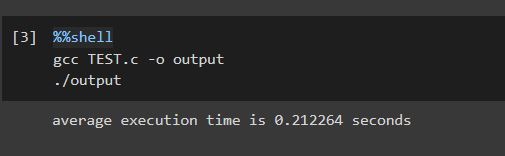

**My own example 21 - Adding c average execution time to the data frame**

In [39]:
new_row = pd.Series(['C', 0.1369, 0], index=df.columns)
df = df.append(new_row, ignore_index=True)

print(df)

        Language  Average secs Speed factor
0         Python     10.169025            0
1          Numpy      0.024777            0
2  Fortran magic      0.045516            0
3        Fortran      0.538751            0
4              C      0.136900            0


<ipython-input-39-702fee76de0e>:2: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)


**My own example 22 - Creating a C++ program that mutiplies 10 times A(600x100) and  B (100x600) matrices**

In [40]:
%%writefile matrixmul.cpp
#include<iostream>
#include<stdlib.h>
#include<time.h>
#include <chrono>
#include <ctime>

using namespace std;
int main()
{

 srand(time(0));
 //Creation of matrices
 int matrix1[600][100], i ,j, matrix2[100][600], k ,l, result [600][600], p;

 for( i = 0; i < 600; ++i){
    for( j = 0;  j < 100; ++j){
      matrix1[i][j] = rand()%100;
    }
}


//setting matrix1
 for( k = 0; k < 100; ++k){
      for( l = 0;  l < 600; ++l){
        matrix1[k][l] = rand()%100;
      }
  }

float mean;
for (p = 0; p<10; p++){
 auto start = std::chrono::system_clock::now();

 for (int m = 0; m <600 ; m++){
   for (int n = 0; n < 600; n++){
     for (int o = 0; o < 100; o++){
      result[m][n] +=  matrix1[m][o] * matrix2[o][n];
     }
   }
 }
    auto end = std::chrono::system_clock::now();
    std::chrono::duration<double> elapsed_seconds = end-start;
    mean = mean + elapsed_seconds.count();
}
cout<<mean/10;



   return 0;
  }

Writing matrixmul.cpp


**My own example 23 - Running the C++ program that mutiplies 10 times A(600x100) and  B (100x600) matrices**

In [41]:
!g++ matrixmul.cpp -o matrixmul
!./matrixmul

0.315726

**My own example 24 - Adding C++ average execution time to the data frame**

In [42]:
new_row = pd.Series(['C++', 0.3157, 0], index=df.columns)
df = df.append(new_row, ignore_index=True)

print(df)

        Language  Average secs Speed factor
0         Python     10.169025            0
1          Numpy      0.024777            0
2  Fortran magic      0.045516            0
3        Fortran      0.538751            0
4              C      0.136900            0
5            C++      0.315700            0


<ipython-input-42-26ca7dcf4e5e>:2: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)


**My own example 25 - Creating a Java program that mutiplies 10 times A(600x100) and  B (100x600) matrices**

In [44]:
%%writefile test.java
public class Main {

  public static int[][] matricesMult ( int[][] a, int[][] b) {

      int[][] c = new int[a.length][b[0].length];

      for (int i= 0; i<c.length; i++)
          for (int j=0; j<c[0].length; j++)
              for (int k=0; k<b.length; k++)
                  c[i][j] = c[i][j] + a[i][k] * b[k][j];

      return c;

   }

public static void main(String[] args) {
  int[][] matrixA = new int[600][100];
  for (int x=0; x < matrixA.length; x++) {
    for (int y=0; y < matrixA[x].length; y++) {
      matrixA[x][y] = (int) (Math.random()*9+1);
    }
}
        int[][] matrixB = new int[100][600];
          for (int x=0; x < matrixB.length; x++) {
            for (int y=0; y < matrixB[x].length; y++) {
              matrixB[x][y] = (int) (Math.random()*9+1);
         }
}
          double a= 0.0;
          long mean=0;
        for(int i=0; i<10;i++){
          long init = System.currentTimeMillis();
          matricesMult(matrixA,matrixB);
          long end = System.currentTimeMillis();
          long time = (long) ((end - init));
          mean = mean + time;
        }
        a=mean/10;
        a= a*0.001;
        System.out.println(a);
  }
}

Overwriting test.java


**My own example 26 - Running the Java program that mutiplies 10 times A(600x100) and  B (100x600) matrices**

In [46]:
!java test.java

0.091


**My own example 27 - Adding Java average execution time to the data frame**

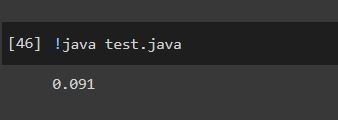

In [47]:
new_row = pd.Series(['Java', 0.091, 0], index=df.columns)
df = df.append(new_row, ignore_index=True)

print(df)

        Language  Average secs Speed factor
0         Python     10.169025            0
1          Numpy      0.024777            0
2  Fortran magic      0.045516            0
3        Fortran      0.538751            0
4              C      0.136900            0
5            C++      0.315700            0
6           Java      0.091000            0


<ipython-input-47-2b3c7b789460>:2: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)


**My own example 28 - Creating a Javascript program that mutiplies 10 times A(600x100) and  B (100x600) matrices**

In [50]:
%%writefile test.js

var myArray = []

for (var i = 0; i < 600; i++) {
  a=Array.from({length: 100}, () => Math.floor(Math.random() * 40));
  myArray.push(a)
}

var myArray_2 = []

for (var i = 0; i < 100; i++) {
  a=Array.from({length: 600
  }, () => Math.floor(Math.random() * 40));
  myArray_2.push(a)
}

sum=0
for(i=0; i<10;i++){
    var start = Date.now();
    mult(myArray,myArray_2)
    var end = Date.now();
    sum +=(end-start)
}

console.log(`Average time: ${sum/10} ms`)

function mult(a,b){
 fil_m1 = a.length;
    col_m1 = a[0].length;
    fil_m2 = b.length;
    col_m2 = b[0].length;
    let multi = new Array(fil_m1);
    for (x=0; x<multi.length;x++){
        multi[x] = new Array(col_m2).fill(0);

    }
    for (x=0; x < multi.length; x++) {
        for (y=0; y < multi[x].length; y++) {
            for (z=0; z<col_m1; z++) {
                multi [x][y] += + a[x][z]*b[z][y];
            }
        }
    }
}

Overwriting test.js


**My own example 29 - Running the Javascript program that mutiplies 10 times A(600x100) and  B (100x600) matrices**

In [51]:
!node test.js

Average time: 403.1 ms


**My own example 30 - Adding Javascript average execution time to the data frame**

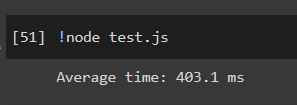

In [52]:
new_row = pd.Series(['JavaSript', 0.4031, 0], index=df.columns)
df = df.append(new_row, ignore_index=True)

print(df)

        Language  Average secs Speed factor
0         Python     10.169025            0
1          Numpy      0.024777            0
2  Fortran magic      0.045516            0
3        Fortran      0.538751            0
4              C      0.136900            0
5            C++      0.315700            0
6           Java      0.091000            0
7      JavaSript      0.403100            0


<ipython-input-52-0fd73e400e6f>:2: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)


**My own example 31 - Finding the minimun average esecuiton time in the data frame**

In [53]:
min = df.loc[:,'Average secs'] == df['Average secs'].min()
print(df.loc[min])

  Language  Average secs Speed factor
1    Numpy      0.024777            0


**My own example 32 - Adding the Speed factor columne to the data frame**

In [54]:
b=df['Average secs'].min()
myList =[]
for i in range(df.shape[0]):
  myList.append( (df.loc[i,'Average secs']) /b)

df['Speed factor']=myList

df.head()

,Language,Average secs,Speed factor
0,Python,10.169025,410.419067
1,Numpy,0.024777,1.000000
2,Fortran magic,0.045516,1.837023
3,Fortran,0.538751,21.743843
4,C,0.136900,5.525247


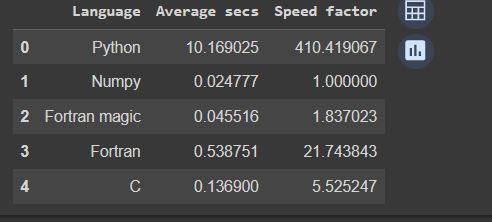

**My own example 33 - Sorting the the data frame by average execution time**

In [55]:
ordered = df.sort_values('Average secs')
print(ordered)

        Language  Average secs  Speed factor
1          Numpy      0.024777      1.000000
2  Fortran magic      0.045516      1.837023
6           Java      0.091000      3.672735
4              C      0.136900      5.525247
5            C++      0.315700     12.741566
7      JavaSript      0.403100     16.269006
3        Fortran      0.538751     21.743843
0         Python     10.169025    410.419067


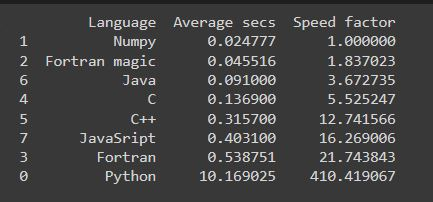

## Why is the Python Version so Much Slower?

In [ ]:
# Dynamic typing.
def mul_elemwise(xs, ys):
    return [x * y for x, y in zip(xs, ys)]

mul_elemwise([1, 2, 3, 4], [1, 2 + 0j, 3.0, 'four'])
#[type(x) for x in _]

[1, (4+0j), 9.0, 'fourfourfourfour']

In [ ]:
# Interpretation overhead.
source_code = 'a + b * c'
bytecode = compile(source_code, '', 'eval')
import dis; dis.dis(bytecode)

  1           0 LOAD_NAME                0 (a)
              2 LOAD_NAME                1 (b)
              4 LOAD_NAME                2 (c)
              6 BINARY_MULTIPLY
              8 BINARY_ADD
             10 RETURN_VALUE


## Why is the Python Version so Slow?
- Dynamic typing means that every single operation requires dispatching on the input type.
- Having an interpreter means that every instruction is fetched and dispatched at runtime.
- Other overheads:
  - Arbitrary-size integers.
  - Reference-counted garbage collection.

> This is the paradox that we have to work with when we're doing scientific or numerically-intensive Python. What makes Python fast for development -- this high-level, interpreted, and dynamically-typed aspect of the language -- is exactly what makes it slow for code execution.

- Jake VanderPlas, [*Losing Your Loops: Fast Numerical Computing with NumPy*](https://www.youtube.com/watch?v=EEUXKG97YRw)

# What Do We Do?

<center><img src="https://raw.githubusercontent.com/ssanderson/pydata-toolbox/master/notebooks/images/runaway.gif" alt="Drawing" style="width: 50%;"/></center>

<center><img src="https://raw.githubusercontent.com/ssanderson/pydata-toolbox/master/notebooks/images/thisisfine.gif" alt="Drawing" style="width: 1080px;"/></center>

- Python is slow for numerical computation because it performs dynamic dispatch on every operation we perform...

- ...but often, we just want to do the same thing over and over in a loop!

- If we don't need Python's dynamicism, we don't want to pay (much) for it.

- **Idea:** Dispatch **once per operation** instead of **once per element**.

In [ ]:
import numpy as np

data = np.array([1, 2, 3, 4])
data

array([1, 2, 3, 4])

In [ ]:
data + data

array([2, 4, 6, 8])

In [ ]:
%%time
# Naive dot product
(array_data * array_data).sum()

CPU times: user 0 ns, sys: 0 ns, total: 0 ns
Wall time: 408 µs


333328333350000.0

In [ ]:
%%time
# Built-in dot product.
array_data.dot(array_data)

CPU times: user 0 ns, sys: 0 ns, total: 0 ns
Wall time: 162 µs


333328333350000.0

In [ ]:
%%time
fortran_dot_product(array_data, array_data)

CPU times: user 0 ns, sys: 0 ns, total: 0 ns
Wall time: 313 µs


333328333350000.0

In [ ]:
# Numpy won't allow us to write a string into an int array.
data[0] = "foo"

ValueError: invalid literal for int() with base 10: 'foo'

In [ ]:
# We also can't grow an array once it's created.
data.append(3)

In [ ]:
# We **can** reshape an array though.
two_by_two = data.reshape(2, 2)
two_by_two

Numpy arrays are:

- Fixed-type

- Size-immutable

- Multi-dimensional

- Fast\*

\* If you use them correctly.

# What's in an Array?

In [ ]:
arr = np.array([1, 2, 3, 4, 5, 6], dtype='int16').reshape(2, 3)
print("Array:\n", arr, sep='')
print("===========")
print("DType:", arr.dtype)
print("Shape:", arr.shape)
print("Strides:", arr.strides)
print("Data:", arr.data.tobytes())

Array:
[[1 2 3]
 [4 5 6]]
DType: int16
Shape: (2, 3)
Strides: (6, 2)
Data: b'\x01\x00\x02\x00\x03\x00\x04\x00\x05\x00\x06\x00'


# Core Operations

- Vectorized **ufuncs** for elementwise operations.
- Fancy indexing and masking for selection and filtering.
- Aggregations across axes.
- Broadcasting

# UFuncs

UFuncs (universal functions) are functions that operate elementwise on one or more arrays.

In [ ]:
data = np.arange(15).reshape(3, 5)
data

array([[ 0,  1,  2,  3,  4],
       [ 5,  6,  7,  8,  9],
       [10, 11, 12, 13, 14]])

In [ ]:
# Binary operators.
data * data

array([[  0,   1,   4,   9,  16],
       [ 25,  36,  49,  64,  81],
       [100, 121, 144, 169, 196]])

In [ ]:
# Unary functions.
np.sqrt(data)

array([[ 0.        ,  1.        ,  1.41421356,  1.73205081,  2.        ],
       [ 2.23606798,  2.44948974,  2.64575131,  2.82842712,  3.        ],
       [ 3.16227766,  3.31662479,  3.46410162,  3.60555128,  3.74165739]])

In [ ]:
# Comparison operations
(data % 3) == 0

array([[ True, False, False,  True, False],
       [False,  True, False, False,  True],
       [False, False,  True, False, False]], dtype=bool)

In [ ]:
# Boolean combinators.
((data % 2) == 0) & ((data % 3) == 0)

array([[ True, False, False, False, False],
       [False,  True, False, False, False],
       [False, False,  True, False, False]], dtype=bool)

In [ ]:
# as of python 3.5, @ is matrix-multiply
data @ data.T

array([[ 30,  80, 130],
       [ 80, 255, 430],
       [130, 430, 730]])

# UFuncs Review

- UFuncs provide efficient elementwise operations applied across one or more arrays.
- Arithmetic Operators (`+`, `*`, `/`)
- Comparisons (`==`, `>`, `!=`)
- Boolean Operators (`&`, `|`, `^`)
- Trigonometric Functions (`sin`, `cos`)
- Transcendental Functions (`exp`, `log`)

# Selections

We often want to perform an operation on just a subset of our data.

In [ ]:
sines = np.sin(np.linspace(0, 3.14, 10))
cosines = np.cos(np.linspace(0, 3.14, 10))
sines

array([ 0.        ,  0.34185385,  0.64251645,  0.86575984,  0.98468459,
        0.98496101,  0.8665558 ,  0.64373604,  0.34335012,  0.00159265])

In [ ]:
# Slicing works with the same semantics as Python lists.
sines[0]

0.0

In [ ]:
sines[:3]  # First three elements

array([ 0.        ,  0.34185385,  0.64251645])

In [ ]:
sines[5:]  # Elements from 5 on.

array([ 0.98496101,  0.8665558 ,  0.64373604,  0.34335012,  0.00159265])

In [ ]:
sines[::2]  # Every other element.

array([ 0.        ,  0.64251645,  0.98468459,  0.8665558 ,  0.34335012])

In [ ]:
# More interesting: we can index with boolean arrays to filter by a predicate.
print("sines:\n", sines)
print("sines > 0.5:\n", sines > 0.5)
print("sines[sines > 0.5]:\n", sines[sines > 0.5])

sines:
 [ 0.          0.34185385  0.64251645  0.86575984  0.98468459  0.98496101
  0.8665558   0.64373604  0.34335012  0.00159265]
sines > 0.5:
 [False False  True  True  True  True  True  True False False]
sines[sines > 0.5]:
 [ 0.64251645  0.86575984  0.98468459  0.98496101  0.8665558   0.64373604]


In [ ]:
# We index with lists/arrays of integers to select values at those indices.
print(sines)
sines[[0, 4, 7]]

[ 0.          0.34185385  0.64251645  0.86575984  0.98468459  0.98496101
  0.8665558   0.64373604  0.34335012  0.00159265]


array([ 0.        ,  0.98468459,  0.64373604])

In [ ]:
# Index arrays are often used for sorting one or more arrays.
unsorted_data = np.array([1, 3, 2, 12, -1, 5, 2])

In [ ]:
sort_indices = np.argsort(unsorted_data)
sort_indices

array([4, 0, 2, 6, 1, 5, 3])

In [ ]:
unsorted_data[sort_indices]

array([-1,  1,  2,  2,  3,  5, 12])

In [ ]:
market_caps = np.array([12, 6, 10, 5, 6])  # Presumably in dollars?
assets = np.array(['A', 'B', 'C', 'D', 'E'])

In [ ]:
# Sort assets by market cap by using the permutation that would sort market caps on ``assets``.
sort_by_mcap = np.argsort(market_caps)
assets[sort_by_mcap]

array(['D', 'B', 'E', 'C', 'A'],
      dtype='<U1')

In [ ]:
# Indexers are also useful for aligning data.
print("Dates:\n", repr(event_dates))
print("Values:\n", repr(event_values))
print("Calendar:\n", repr(calendar))

Dates:
 array(['2017-01-06', '2017-01-07', '2017-01-08'], dtype='datetime64[D]')
Values:
 array([10, 15, 20])
Calendar:
 array(['2017-01-03', '2017-01-04', '2017-01-05', '2017-01-06',
       '2017-01-09', '2017-01-10', '2017-01-11', '2017-01-12',
       '2017-01-13', '2017-01-17', '2017-01-18', '2017-01-19',
       '2017-01-20', '2017-01-23', '2017-01-24', '2017-01-25',
       '2017-01-26', '2017-01-27', '2017-01-30', '2017-01-31', '2017-02-01'], dtype='datetime64[D]')


In [ ]:
print("Raw Dates:", event_dates)
print("Indices:", calendar.searchsorted(event_dates))
print("Forward-Filled Dates:", calendar[calendar.searchsorted(event_dates)])

Raw Dates: ['2017-01-06' '2017-01-07' '2017-01-08']
Indices: [3 4 4]
Forward-Filled Dates: ['2017-01-06' '2017-01-09' '2017-01-09']


On multi-dimensional arrays, we can slice along each axis independently.

In [ ]:
data = np.arange(25).reshape(5, 5)
data

array([[ 0,  1,  2,  3,  4],
       [ 5,  6,  7,  8,  9],
       [10, 11, 12, 13, 14],
       [15, 16, 17, 18, 19],
       [20, 21, 22, 23, 24]])

In [ ]:
data[:2, :2]  # First two rows and first two columns.

array([[0, 1],
       [5, 6]])

In [ ]:
data[:2, [0, -1]]  # First two rows, first and last columns.

array([[0, 4],
       [5, 9]])

In [ ]:
data[(data[:, 0] % 2) == 0]  # Rows where the first column is divisible by two.

array([[ 0,  1,  2,  3,  4],
       [10, 11, 12, 13, 14],
       [20, 21, 22, 23, 24]])

# Selections Review

- Indexing with an integer removes a dimension.
- Slicing operations work on Numpy arrays the same way they do on lists.
- Indexing with a boolean array filters to True locations.
- Indexing with an integer array selects indices along an axis.
- Multidimensional arrays can apply selections independently along different axes.

## Reductions

Functions that reduce an array to a scalar.

$Var(X) = \frac{1}{N}\sqrt{\sum_{i=1}^N (x_i - \bar{x})^2}$

In [ ]:
def variance(x):
    return ((x - x.mean()) ** 2).sum() / len(x)

In [ ]:
variance(np.random.standard_normal(1000))

1.0638195544963331

- `sum()` and `mean()` are both **reductions**.

- In the simplest case, we use these to reduce an entire array into a single value...

In [ ]:
data = np.arange(30)
data.mean()

14.5

- ...but we can do more interesting things with multi-dimensional arrays.

In [ ]:
data = np.arange(30).reshape(3, 10)
data

array([[ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9],
       [10, 11, 12, 13, 14, 15, 16, 17, 18, 19],
       [20, 21, 22, 23, 24, 25, 26, 27, 28, 29]])

In [ ]:
data.mean()

14.5

In [ ]:
data.mean(axis=0)

array([ 10.,  11.,  12.,  13.,  14.,  15.,  16.,  17.,  18.,  19.])

In [ ]:
data.mean(axis=1)

array([  4.5,  14.5,  24.5])

## Reductions Review

- Reductions allow us to perform efficient aggregations over arrays.
- We can do aggregations over a single axis to collapse a single dimension.
- Many built-in reductions (`mean`, `sum`, `min`, `max`, `median`, ...).

# Broadcasting

In [ ]:
row = np.array([1, 2, 3, 4])
column = np.array([[1], [2], [3]])
print("Row:\n", row, sep='')
print("Column:\n", column, sep='')

Row:
[1 2 3 4]
Column:
[[1]
 [2]
 [3]]


In [ ]:
row + column

array([[2, 3, 4, 5],
       [3, 4, 5, 6],
       [4, 5, 6, 7]])

<center><img src="https://raw.githubusercontent.com/ssanderson/pydata-toolbox/master/notebooks/images/broadcasting.png" alt="Drawing" style="width: 60%;"/></center>

<h5>Source: http://www.scipy-lectures.org/_images/numpy_broadcasting.png</h5>

In [ ]:
# Broadcasting is particularly useful in conjunction with reductions.
print("Data:\n", data, sep='')
print("Mean:\n", data.mean(axis=0), sep='')
print("Data - Mean:\n", data - data.mean(axis=0), sep='')

Data:
[[ 0  1  2  3  4  5  6  7  8  9]
 [10 11 12 13 14 15 16 17 18 19]
 [20 21 22 23 24 25 26 27 28 29]]
Mean:
[ 10.  11.  12.  13.  14.  15.  16.  17.  18.  19.]
Data - Mean:
[[-10. -10. -10. -10. -10. -10. -10. -10. -10. -10.]
 [  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.]
 [ 10.  10.  10.  10.  10.  10.  10.  10.  10.  10.]]


# Broadcasting Review

- Numpy operations can work on arrays of different dimensions as long as the arrays' shapes are still "compatible".
- Broadcasting works by "tiling" the smaller array along the missing dimension.
- The result of a broadcasted operation is always at least as large in each dimension as the largest array in that dimension.

# Numpy Review

- Numerical algorithms are slow in pure Python because the overhead dynamic dispatch dominates our runtime.

- Numpy solves this problem by:
  1. Imposing additional restrictions on the contents of arrays.
  2. Moving the inner loops of our algorithms into compiled C code.

- Using Numpy effectively often requires reworking an algorithms to use vectorized operations instead of for-loops, but the resulting operations are usually simpler, clearer, and faster than the pure Python equivalent.

<center><img src="https://raw.githubusercontent.com/ssanderson/pydata-toolbox/master/notebooks/images/unicorn.jpg" alt="Drawing" style="width: 75%;"/></center>

Numpy is great for many things, but...

- Sometimes our data is equipped with a natural set of **labels**:
  - Dates/Times
  - Stock Tickers
  - Field Names (e.g. Open/High/Low/Close)

- Sometimes we have **more than one type of data** that we want to keep grouped together.
  - Tables with a mix of real-valued and categorical data.

- Sometimes we have **missing** data, which we need to ignore, fill, or otherwise work around.

<center><img src="https://raw.githubusercontent.com/ssanderson/pydata-toolbox/master/notebooks/images/panda-wrangling.gif" alt="Drawing" style="width: 75%;"/></center>

<center><img src="https://raw.githubusercontent.com/ssanderson/pydata-toolbox/master/notebooks/images/pandas_logo.png" alt="Drawing" style="width: 75%;"/></center>


Pandas extends Numpy with more complex data structures:

- `Series`: 1-dimensional, homogenously-typed, labelled array.
- `DataFrame`: 2-dimensional, semi-homogenous, labelled table.

Pandas also provides many utilities for:
- Input/Output
- Data Cleaning
- Rolling Algorithms
- Plotting

# Selection in Pandas

In [ ]:
s = pd.Series(index=['a', 'b', 'c', 'd', 'e'], data=[1, 2, 3, 4, 5])
s

a    1
b    2
c    3
d    4
e    5
dtype: int64

In [ ]:
# There are two pieces to a Series: the index and the values.
print("The index is:", s.index)
print("The values are:", s.values)

The index is: Index(['a', 'b', 'c', 'd', 'e'], dtype='object')
The values are: [1 2 3 4 5]


In [ ]:
# We can look up values out of a Series by position...
s.iloc[0]

1

In [ ]:
# ... or by label.
s.loc['a']

1

In [ ]:
# Slicing works as expected...
s.iloc[:2]

a    1
b    2
dtype: int64

In [ ]:
# ...but it works with labels too!
s.loc[:'c']

a    1
b    2
c    3
dtype: int64

In [ ]:
# Fancy indexing works the same as in numpy.
s.iloc[[0, -1]]

a    1
e    5
dtype: int64

In [ ]:
# As does boolean masking.
s.loc[s > 2]

c    3
d    4
e    5
dtype: int64

In [ ]:
# Element-wise operations are aligned by index.
other_s = pd.Series({'a': 10.0, 'c': 20.0, 'd': 30.0, 'z': 40.0})
other_s

a    10.0
c    20.0
d    30.0
z    40.0
dtype: float64

In [ ]:
s + other_s

a    11.0
b     NaN
c    23.0
d    34.0
e     NaN
z     NaN
dtype: float64

In [ ]:
# We can fill in missing values with fillna().
(s + other_s).fillna(0.0)

a    11.0
b     0.0
c    23.0
d    34.0
e     0.0
z     0.0
dtype: float64

In [ ]:
# Most real datasets are read in from an external file format.
aapl = pd.read_csv('AAPL.csv', parse_dates=['Date'], index_col='Date')
aapl.head()

,Adj Close,Close,High,Low,Open,Volume
Date,,,,,,
2010-01-04,27.613066,30.572857,30.642857,30.340000,30.490000,123432400.0
2010-01-05,27.660807,30.625713,30.798571,30.464285,30.657143,150476200.0
2010-01-06,27.220825,30.138571,30.747143,30.107143,30.625713,138040000.0
2010-01-07,27.170504,30.082857,30.285715,29.864286,30.250000,119282800.0
2010-01-08,27.351143,30.282858,30.285715,29.865715,30.042856,111902700.0


In [ ]:
# Slicing generalizes to two dimensions as you'd expect:
aapl.iloc[:2, :2]

,Adj Close,Close
Date,,
2010-01-04,27.613066,30.572857
2010-01-05,27.660807,30.625713


In [ ]:
aapl.loc[pd.Timestamp('2010-02-01'):pd.Timestamp('2010-02-04'), ['Close', 'Volume']]

,Close,Volume
Date,,
2010-02-01,27.818571,187469100.0
2010-02-02,27.980000,174585600.0
2010-02-03,28.461428,153832000.0
2010-02-04,27.435715,189413000.0


# Rolling Operations

<center><img src="https://raw.githubusercontent.com/ssanderson/pydata-toolbox/master/notebooks/images/rolling.gif" alt="Drawing" style="width: 75%;"/></center>

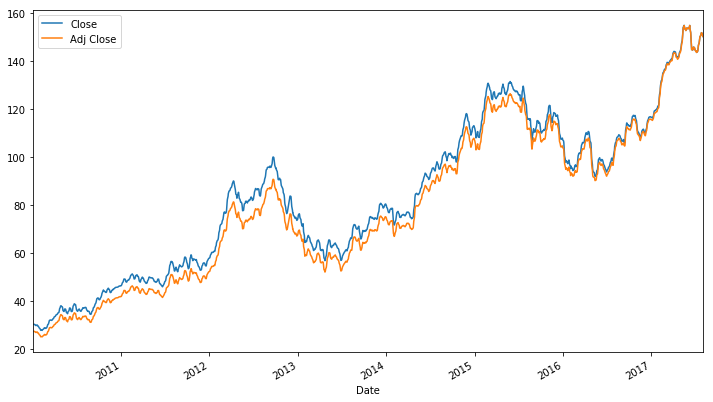

In [ ]:
aapl.rolling(5)[['Close', 'Adj Close']].mean().plot();

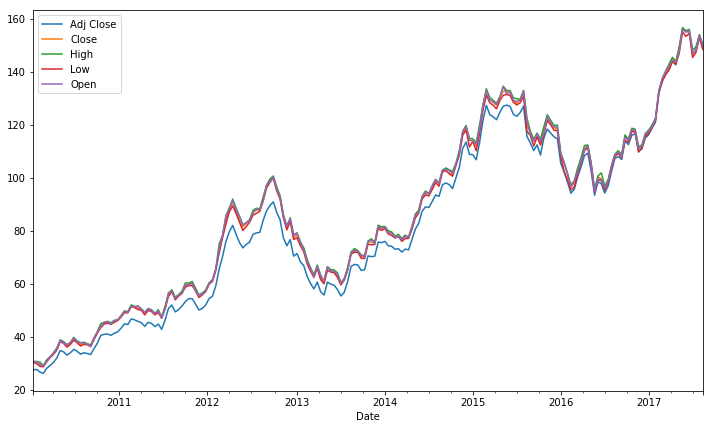

In [ ]:
# Drop `Volume`, since it's way bigger than everything else.
aapl.drop('Volume', axis=1).resample('2W').max().plot();

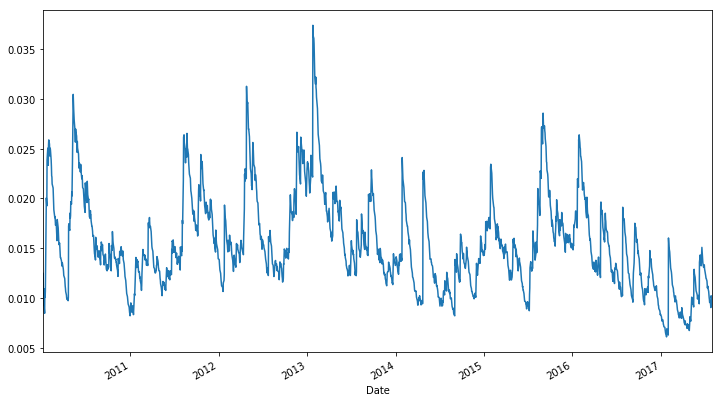

In [ ]:
# 30-day rolling exponentially-weighted stddev of returns.
aapl['Close'].pct_change().ewm(span=30).std().plot();

# "Real World" Data

In [ ]:
from demos.avocados import read_avocadata

avocados = read_avocadata('2014', '2016')
avocados.head()

,Date,Region,Variety,Organic,Number of Stores,Weighted Avg Price,Low Price,High Price
0,2014-01-03 00:00:00+00:00,NATIONAL,HASS,False,9184,0.93,NaN,NaN
1,2014-01-03 00:00:00+00:00,NATIONAL,HASS,True,872,1.44,NaN,NaN
2,2014-01-03 00:00:00+00:00,NORTHEAST,HASS,False,1449,1.08,0.5,1.67
3,2014-01-03 00:00:00+00:00,NORTHEAST,HASS,True,66,1.54,1.5,2.00
4,2014-01-03 00:00:00+00:00,SOUTHEAST,HASS,False,2286,0.98,0.5,1.99


In [ ]:
# Unlike numpy arrays, pandas DataFrames can have a different dtype for each column.
avocados.dtypes

Date                  datetime64[ns, UTC]
Region                             object
Variety                            object
Organic                              bool
Number of Stores                    int64
Weighted Avg Price                float64
Low Price                         float64
High Price                        float64
dtype: object

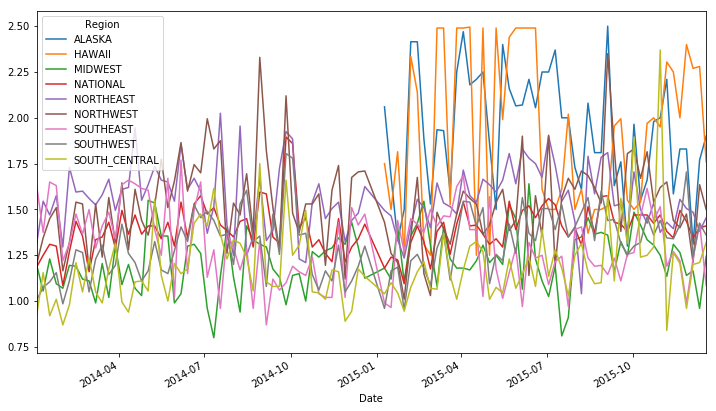

In [ ]:
# What's the regional average price of a HASS avocado every day?
hass = avocados[avocados.Variety == 'HASS']
hass.groupby(['Date', 'Region'])['Weighted Avg Price'].mean().unstack().ffill().plot();

In [ ]:
def _organic_spread(group):

    if len(group.columns) != 2:
        return pd.Series(index=group.index, data=0.0)

    is_organic = group.columns.get_level_values('Organic').values.astype(bool)
    organics = group.loc[:, is_organic].squeeze()
    non_organics = group.loc[:, ~is_organic].squeeze()
    diff = organics - non_organics
    return diff

def organic_spread_by_region(df):
    """What's the difference between the price of an organic
    and non-organic avocado within each region?
    """
    return (
        df
        .set_index(['Date', 'Region', 'Organic'])
         ['Weighted Avg Price']
        .unstack(level=['Region', 'Organic'])
        .ffill()
        .groupby(level='Region', axis=1)
        .apply(_organic_spread)
    )

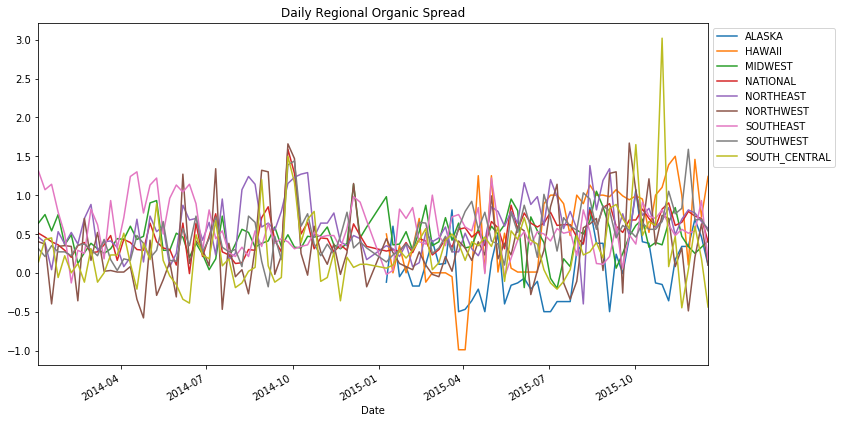

In [ ]:
organic_spread_by_region(hass).plot();
plt.gca().set_title("Daily Regional Organic Spread");
plt.legend(bbox_to_anchor=(1, 1));

In [ ]:
spread_correlation = organic_spread_by_region(hass).corr()
spread_correlation

Region,ALASKA,HAWAII,MIDWEST,NATIONAL,NORTHEAST,NORTHWEST,SOUTHEAST,SOUTHWEST,SOUTH_CENTRAL
Region,,,,,,,,,
ALASKA,1.000000,0.202723,0.175251,0.007844,0.051049,0.087575,0.129079,-0.070868,0.161624
HAWAII,0.202723,1.000000,-0.021116,0.373914,0.247171,0.341155,0.019388,0.159192,0.092632
MIDWEST,0.175251,-0.021116,1.000000,0.062595,-0.010213,-0.043783,0.047437,-0.059128,0.068902
NATIONAL,0.007844,0.373914,0.062595,1.000000,0.502035,0.579102,-0.040539,0.635006,0.486524
NORTHEAST,0.051049,0.247171,-0.010213,0.502035,1.000000,0.242039,-0.236225,0.360389,0.149881
NORTHWEST,0.087575,0.341155,-0.043783,0.579102,0.242039,1.000000,-0.032306,0.165992,0.349935
SOUTHEAST,0.129079,0.019388,0.047437,-0.040539,-0.236225,-0.032306,1.000000,-0.167631,-0.021176
SOUTHWEST,-0.070868,0.159192,-0.059128,0.635006,0.360389,0.165992,-0.167631,1.000000,0.254504
SOUTH_CENTRAL,0.161624,0.092632,0.068902,0.486524,0.149881,0.349935,-0.021176,0.254504,1.000000


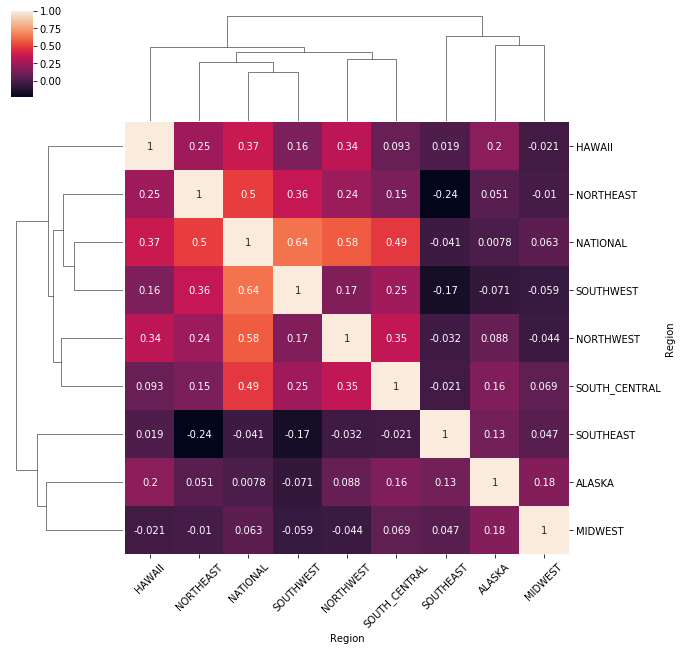

In [ ]:
import seaborn as sns
grid = sns.clustermap(spread_correlation, annot=True)
fig = grid.fig
axes = fig.axes
ax = axes[2]
ax.set_xticklabels(ax.get_xticklabels(), rotation=45);

**My own example 34 importing and analizing data fromdatos.gov.co**

In [58]:
from google.colab import files
uploaded = files.upload()

Saving cacao.csv to cacao.csv


In [60]:
import pandas as pd
info = pd.read_csv("cacao.csv",decimal=',')
info

,CÓD. \nDEP.,DEPARTAMENTO,CÓD. MUN.,MUNICIPIO,GRUPO \nDE CULTIVO,SUBGRUPO \nDE CULTIVO,CULTIVO,DESAGREGACIÓN REGIONAL Y/O SISTEMA PRODUCTIVO,AÑO,PERIODO,Área Sembrada\n(ha),Área Cosechada\n(ha),Producción\n(t),Rendimiento\n(t/ha),ESTADO FISICO PRODUCCION,NOMBRE \nCIENTIFICO,CICLO DE CULTIVO
0,5,ANTIOQUIA,5045,APARTADO,OTROS PERMANENTES,CACAO,CACAO,CACAO,2007,2007,1830,1640,656,0.4,GRANO SECO,THEOBROMA CACAO,PERMANENTE
1,5,ANTIOQUIA,5837,TURBO,OTROS PERMANENTES,CACAO,CACAO,CACAO,2007,2007,1002,760,304,0.4,GRANO SECO,THEOBROMA CACAO,PERMANENTE
2,5,ANTIOQUIA,5425,MACEO,OTROS PERMANENTES,CACAO,CACAO,CACAO,2007,2007,950,798,279,0.35,GRANO SECO,THEOBROMA CACAO,PERMANENTE
3,5,ANTIOQUIA,5885,YALI,OTROS PERMANENTES,CACAO,CACAO,CACAO,2007,2007,580,269,188,0.7,GRANO SECO,THEOBROMA CACAO,PERMANENTE
4,5,ANTIOQUIA,5490,NECOCLI,OTROS PERMANENTES,CACAO,CACAO,CACAO,2007,2007,523,151,60,0.4,GRANO SECO,THEOBROMA CACAO,PERMANENTE
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6061,76,VALLE DEL CAUCA,76892,YUMBO,OTROS PERMANENTES,CACAO,CACAO,CACAO,2018,2018,2,0,0,NaN,GRANO SECO,THEOBROMA CACAO,PERMANENTE
6062,97,VAUPES,97161,CARURU,OTROS PERMANENTES,CACAO,CACAO,CACAO,2018,2018,30,30,11,0.35,GRANO SECO,THEOBROMA CACAO,PERMANENTE
6063,99,VICHADA,99624,SANTA ROSALIA,OTROS PERMANENTES,CACAO,CACAO,CACAO,2018,2018,920,800,400,0.5,GRANO SECO,THEOBROMA CACAO,PERMANENTE
6064,99,VICHADA,99773,CUMARIBO,OTROS PERMANENTES,CACAO,CACAO,CACAO,2018,2018,280,140,70,0.5,GRANO SECO,THEOBROMA CACAO,PERMANENTE


<Axes: >

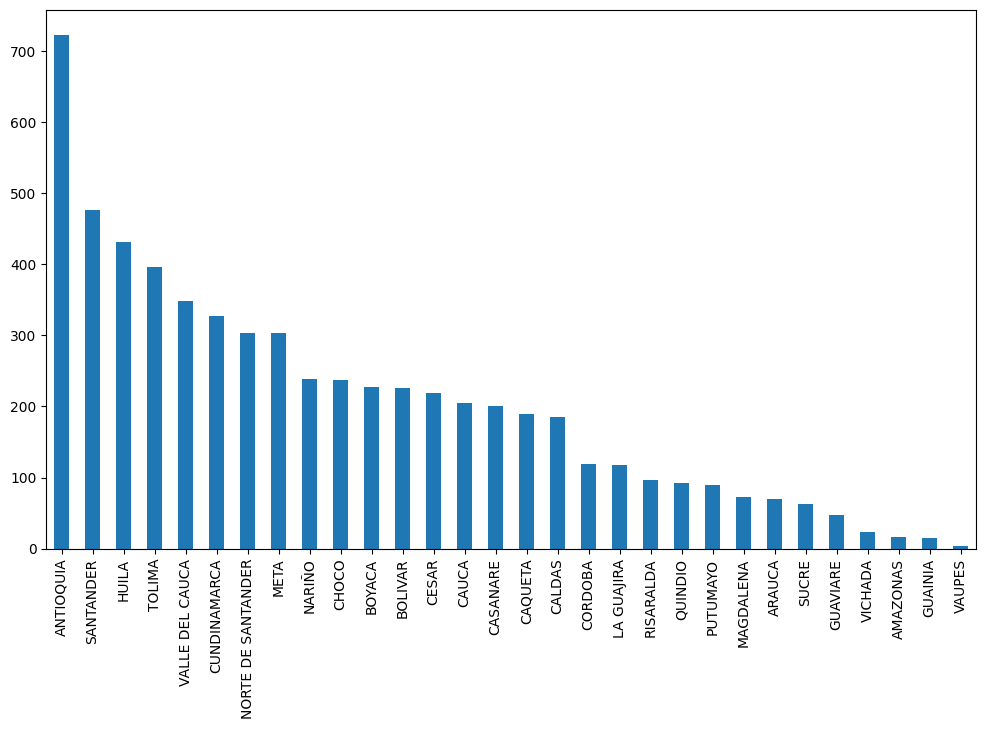

In [62]:
info["DEPARTAMENTO"].value_counts().plot(kind='bar')

**My own example 35**

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 98.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 67.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 95.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 96.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 96.8% of the points cannot be plac

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 99.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 75.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 96.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 98.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 97.3% of the points cannot be plac

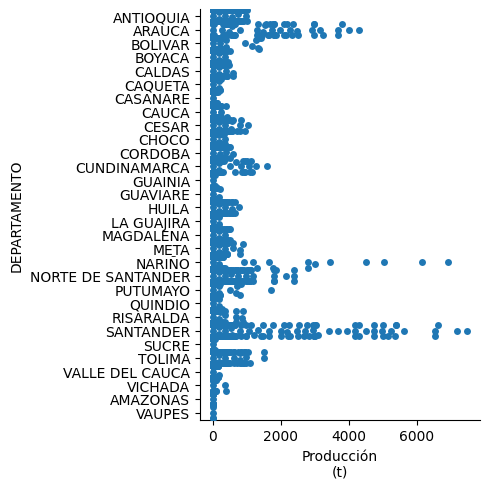

In [63]:
#This graph has no relation with the profuction
sns.catplot(x='Producción\n(t)', y='DEPARTAMENTO', kind='swarm', data= info)

**My own example 36**

In [64]:
#We can have some general statistics about production
pclass_column = info['Área Cosechada\n(ha)']
pclass_column.describe()

count     6066.000000
mean       288.038741
std        977.304806
min          0.000000
25%         14.000000
50%         60.000000
75%        220.000000
max      15360.000000
Name: Área Cosechada\n(ha), dtype: float64

In [65]:
#now sorted by harvested area
info.sort_values(by='Área Cosechada\n(ha)', ascending=False)

,CÓD. \nDEP.,DEPARTAMENTO,CÓD. MUN.,MUNICIPIO,GRUPO \nDE CULTIVO,SUBGRUPO \nDE CULTIVO,CULTIVO,DESAGREGACIÓN REGIONAL Y/O SISTEMA PRODUCTIVO,AÑO,PERIODO,Área Sembrada\n(ha),Área Cosechada\n(ha),Producción\n(t),Rendimiento\n(t/ha),ESTADO FISICO PRODUCCION,NOMBRE \nCIENTIFICO,CICLO DE CULTIVO
3722,52,NARIÑO,52835,TUMACO,OTROS PERMANENTES,CACAO,CACAO,CACAO,2014,2014,17360,15360,6144,0.4,GRANO SECO,THEOBROMA CACAO,PERMANENTE
4241,52,NARIÑO,52835,TUMACO,OTROS PERMANENTES,CACAO,CACAO,CACAO,2015,2015,17360,15360,6912,0.45,GRANO SECO,THEOBROMA CACAO,PERMANENTE
4778,52,NARIÑO,52835,TUMACO,OTROS PERMANENTES,CACAO,CACAO,CACAO,2016,2016,17000,15000,4500,0.3,GRANO SECO,THEOBROMA CACAO,PERMANENTE
2686,52,NARIÑO,52835,TUMACO,OTROS PERMANENTES,CACAO,CACAO,CACAO,2012,2012,15223,14005,5042,0.36,GRANO SECO,THEOBROMA CACAO,PERMANENTE
5870,52,NARIÑO,52835,TUMACO,OTROS PERMANENTES,CACAO,CACAO,CACAO,2018,2018,18600,14000,2800,0.2,GRANO SECO,THEOBROMA CACAO,PERMANENTE
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
427,76,VALLE DEL CAUCA,76895,ZARZAL,OTROS PERMANENTES,CACAO,CACAO,CACAO,2007,2007,12,0,0,NaN,GRANO SECO,THEOBROMA CACAO,PERMANENTE
429,76,VALLE DEL CAUCA,76001,CALI,OTROS PERMANENTES,CACAO,CACAO,CACAO,2007,2007,10,0,0,NaN,GRANO SECO,THEOBROMA CACAO,PERMANENTE
430,76,VALLE DEL CAUCA,76130,CANDELARIA,OTROS PERMANENTES,CACAO,CACAO,CACAO,2007,2007,10,0,0,NaN,GRANO SECO,THEOBROMA CACAO,PERMANENTE
431,76,VALLE DEL CAUCA,76520,PALMIRA,OTROS PERMANENTES,CACAO,CACAO,CACAO,2007,2007,10,0,0,NaN,GRANO SECO,THEOBROMA CACAO,PERMANENTE


<Figure size 1200x1200 with 0 Axes>

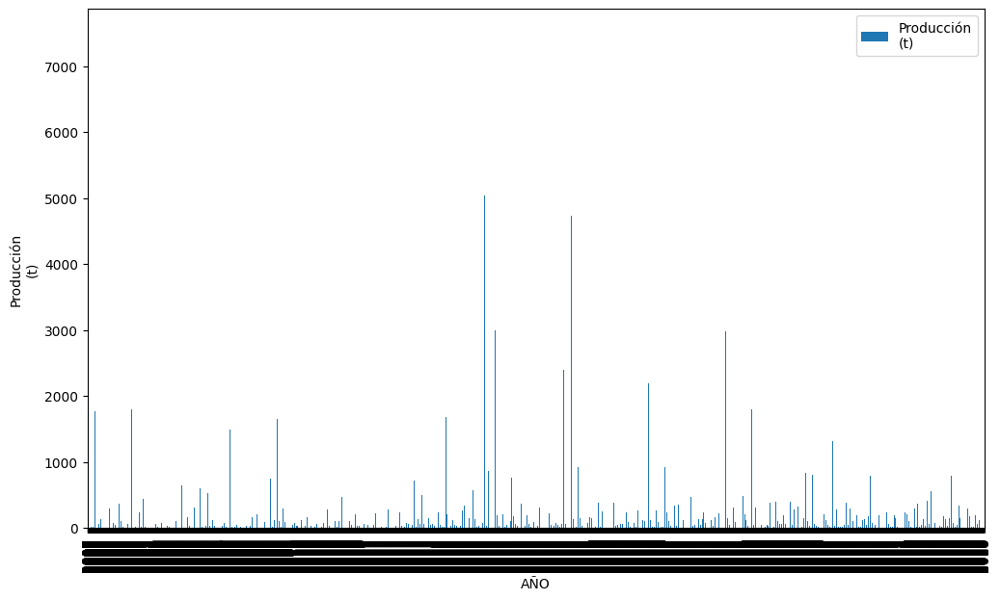

In [66]:
plt.figure(figsize=(12, 12));
info.plot.bar(x='AÑO', y='Producción\n(t)')
plt.xlabel('AÑO')
plt.ylabel('Producción\n(t)')
plt.show()

# Pandas Review

- Pandas extends numpy with more complex datastructures and algorithms.
- If you understand numpy, you understand 90% of pandas.
- `groupby`, `set_index`, and `unstack` are powerful tools for working with categorical data.
- Avocado prices are surprisingly interesting :)

# Thanks!